In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)

In [2]:
sell_prices = pd.read_csv('/Users/dhineashkumar/Desktop/AI project/sell_prices.csv')
calendar = pd.read_csv('/Users/dhineashkumar/Desktop/AI project/calendar.csv')


In [3]:
# Check structure
print("Sell Prices:")
sell_prices.info()
sell_prices.head()

print("\nCalendar:")
calendar.info()
calendar.head()


Sell Prices:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6841121 entries, 0 to 6841120
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   store_id    object 
 1   item_id     object 
 2   wm_yr_wk    int64  
 3   sell_price  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 208.8+ MB

Calendar:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          1969 non-null   object
 1   wm_yr_wk      1969 non-null   int64 
 2   weekday       1969 non-null   object
 3   wday          1969 non-null   int64 
 4   month         1969 non-null   int64 
 5   year          1969 non-null   int64 
 6   event_name_1  162 non-null    object
 7   event_type_1  162 non-null    object
 8   event_name_2  5 non-null      object
 9   event_type_2  5 non-null      object
 10  snap_CA       1969 non-null   int6

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,1,0,1


In [4]:
print(len(sell_prices['store_id'].unique()))
print(len(sell_prices['item_id'].unique()))


10
3049


In [5]:
calendar['date'] = pd.to_datetime(calendar['date'])

merged = pd.merge(sell_prices, calendar, on='wm_yr_wk', how='left')

merged_path = "/Users/dhineashkumar/Desktop/AI project/merged.csv"

merged.head()


,store_id,item_id,wm_yr_wk,sell_price,date,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,CA_1,HOBBIES_1_001,11325,9.58,2013-07-13,Saturday,1,7,2013,NaN,NaN,NaN,NaN,0,1,0
1,CA_1,HOBBIES_1_001,11325,9.58,2013-07-14,Sunday,2,7,2013,NaN,NaN,NaN,NaN,0,0,1
2,CA_1,HOBBIES_1_001,11325,9.58,2013-07-15,Monday,3,7,2013,NaN,NaN,NaN,NaN,0,1,1
3,CA_1,HOBBIES_1_001,11325,9.58,2013-07-16,Tuesday,4,7,2013,NaN,NaN,NaN,NaN,0,0,0
4,CA_1,HOBBIES_1_001,11325,9.58,2013-07-17,Wednesday,5,7,2013,NaN,NaN,NaN,NaN,0,0,0


In [6]:
# Optimize sell_prices
sell_prices['store_id'] = sell_prices['store_id'].astype('category')
sell_prices['item_id'] = sell_prices['item_id'].astype('category')

# Optimize calendar
calendar['weekday'] = calendar['weekday'].astype('category')
calendar['event_name_1'] = calendar['event_name_1'].astype('category')
calendar['event_type_1'] = calendar['event_type_1'].astype('category')
calendar['event_name_2'] = calendar['event_name_2'].astype('category')
calendar['event_type_2'] = calendar['event_type_2'].astype('category')

In [51]:
print("Memory Usage (Optimized):")
print("Sell Prices:", sell_prices.memory_usage(deep=True).sum() / 1024**2, "MB")
print("Calendar:", calendar.memory_usage(deep=True).sum() / 1024**2, "MB")

Memory Usage (Optimized):
Sell Prices: 176.3967924118042 MB
Calendar: 0.13409423828125 MB


In [ ]:
# import os

# # -------------------------
# # 1. Optimization Function
# # -------------------------
# def optimize_dataframe(df):
#     """Downcast numerics, convert low-cardinality objects to categories, and optimize datetime."""
    
#     # Convert 'date' column to datetime
#     if 'date' in df.columns:
#         df['date'] = pd.to_datetime(df['date'], errors='coerce')
    
#     # Downcast integers
#     int_cols = df.select_dtypes(include=['int64', 'int32']).columns
#     df[int_cols] = df[int_cols].apply(pd.to_numeric, downcast='integer')

#     # Downcast floats
#     float_cols = df.select_dtypes(include=['float64', 'float32']).columns
#     df[float_cols] = df[float_cols].apply(pd.to_numeric, downcast='float')

#     # Convert low-cardinality objects to categories
#     for col in df.select_dtypes(include='object').columns:
#         if df[col].nunique() / len(df) < 0.5:
#             df[col] = df[col].astype('category')
    
#     return df


# # -------------------------
# # 2. Load merged dataset (handle Parquet disguised as CSV)
# # -------------------------
# file_path = "/Users/dhineashkumar/Desktop/AI project/merged.csv"

# try:
#     # Try normal CSV read
#     merged = pd.read_csv(file_path, encoding='ISO-8859-1')
# except pd.errors.ParserError:
#     # If CSV fails, try reading as Parquet (in case it was saved incorrectly)
#     merged = pd.read_parquet(file_path)

# # -------------------------
# # 3. Memory usage before optimization
# # -------------------------
# mem_before = merged.memory_usage(deep=True).sum() / 1024**2
# print(f"Memory Before Optimization: {mem_before:.2f} MB")

# # -------------------------
# # 4. Optimize dataset
# # -------------------------
# merged = optimize_dataframe(merged)

# # -------------------------
# # 5. Memory usage after optimization
# # -------------------------
# mem_after = merged.memory_usage(deep=True).sum() / 1024**2
# print(f"Memory After Optimization: {mem_after:.2f} MB")
# print(f"Memory Reduced by: {mem_before - mem_after:.2f} MB ({(1 - mem_after/mem_before)*100:.1f}% reduction)")

# # -------------------------
# # 6. Save optimized dataset
# # -------------------------
# output_dir = "/Users/dhineashkumar/Desktop/AI project"

# # Compressed CSV
# csv_path = os.path.join(output_dir, "merged_optimized.csv.gz")
# merged.to_csv(csv_path, index=False, compression='gzip')

# # Parquet
# parquet_path = os.path.join(output_dir, "merged_optimized.parquet")
# merged.to_parquet(parquet_path, index=False)

# print(f"\nOptimized dataset saved successfully:\nCSV: {csv_path}\nParquet: {parquet_path}")


Memory Before Optimization: 1320.44 MB
Memory After Optimization: 1320.44 MB
Memory Reduced by: 0.00 MB (0.0% reduction)

Optimized dataset saved successfully:
CSV: /Users/dhineashkumar/Desktop/AI project/merged_optimized.csv.gz
Parquet: /Users/dhineashkumar/Desktop/AI project/merged_optimized.parquet


In [57]:
print(merged['date'].min())
print(merged['date'].max())

2011-01-29 00:00:00
2016-06-19 00:00:00


In [58]:
sell_prices.isnull().sum()
calendar.isnull().sum()



date               0
wm_yr_wk           0
weekday            0
wday               0
month              0
year               0
event_name_1    1807
event_type_1    1807
event_name_2    1964
event_type_2    1964
snap_CA            0
snap_TX            0
snap_WI            0
dtype: int64

In [12]:
calendar['date'] = pd.to_datetime(calendar['date'])
calendar.head()
calendar.dtypes



date            datetime64[ns]
wm_yr_wk                 int64
weekday               category
wday                     int64
month                    int64
year                     int64
event_name_1          category
event_type_1          category
event_name_2          category
event_type_2          category
snap_CA                  int64
snap_TX                  int64
snap_WI                  int64
dtype: object

In [13]:
merged.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47735397 entries, 0 to 47735396
Data columns (total 16 columns):
 #   Column        Dtype         
---  ------        -----         
 0   store_id      category      
 1   item_id       category      
 2   wm_yr_wk      int16         
 3   sell_price    float32       
 4   date          datetime64[ns]
 5   weekday       category      
 6   wday          int8          
 7   month         int8          
 8   year          int16         
 9   event_name_1  category      
 10  event_type_1  category      
 11  event_name_2  category      
 12  event_type_2  category      
 13  snap_CA       int8          
 14  snap_TX       int8          
 15  snap_WI       int8          
dtypes: category(7), datetime64[ns](1), float32(1), int16(2), int8(5)
memory usage: 1.3 GB


In [14]:
merged.isnull().sum()

store_id               0
item_id                0
wm_yr_wk               0
sell_price             0
date                   0
weekday                0
wday                   0
month                  0
year                   0
event_name_1    43805087
event_type_1    43805087
event_name_2    47610424
event_type_2    47610424
snap_CA                0
snap_TX                0
snap_WI                0
dtype: int64

In [15]:
# Extract unique item_ids
item_ids = merged['item_id'].unique()

# Convert to DataFrame
item_ids_df = pd.DataFrame(item_ids, columns=['item_id'])

# Save to CSV
item_ids_path = "/Users/dhineashkumar/Desktop/AI project/item ids.csv"
item_ids_df.to_csv(item_ids_path, index=False)

item_ids_path


'/Users/dhineashkumar/Desktop/AI project/item ids.csv'

In [16]:
merged.head()

,store_id,item_id,wm_yr_wk,sell_price,date,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,CA_1,HOBBIES_1_001,11325,9.58,2013-07-13,Saturday,1,7,2013,NaN,NaN,NaN,NaN,0,1,0
1,CA_1,HOBBIES_1_001,11325,9.58,2013-07-14,Sunday,2,7,2013,NaN,NaN,NaN,NaN,0,0,1
2,CA_1,HOBBIES_1_001,11325,9.58,2013-07-15,Monday,3,7,2013,NaN,NaN,NaN,NaN,0,1,1
3,CA_1,HOBBIES_1_001,11325,9.58,2013-07-16,Tuesday,4,7,2013,NaN,NaN,NaN,NaN,0,0,0
4,CA_1,HOBBIES_1_001,11325,9.58,2013-07-17,Wednesday,5,7,2013,NaN,NaN,NaN,NaN,0,0,0


In [17]:
min_date = merged['date'].min()
max_date = merged['date'].max()
print(f"Date Range: {min_date} to {max_date}")

Date Range: 2011-01-29 00:00:00 to 2016-06-19 00:00:00


In [18]:
sample_items = merged['item_id'].unique()[:3]
sample_stores = merged['store_id'].unique()[:2]

In [19]:
# Filter data for selected items & stores
filtered_df = merged[
    merged['item_id'].isin(sample_items) &
    merged['store_id'].isin(sample_stores)
]

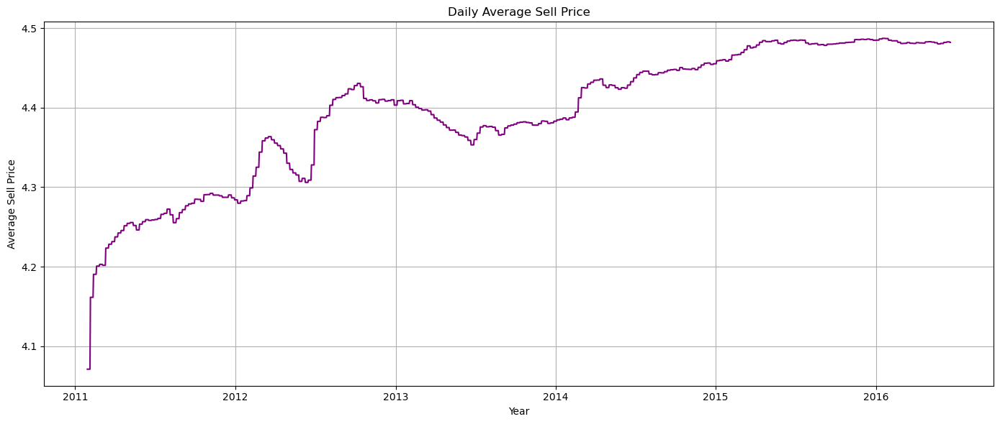

In [20]:
import matplotlib.dates as mdates

# Daily average sell price
daily_avg = merged.groupby('date')['sell_price'].mean().reset_index()

# Plot
plt.figure(figsize=(14,6))
plt.plot(daily_avg['date'], daily_avg['sell_price'], color='purple')
plt.title('Daily Average Sell Price')
plt.xlabel('Year')
plt.ylabel('Average Sell Price')

# Format x-axis to show year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())       # Major ticks every year
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format as YYYY

plt.grid(True)
plt.tight_layout()
plt.show()


In [21]:
merged.head(10)

,store_id,item_id,wm_yr_wk,sell_price,date,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,CA_1,HOBBIES_1_001,11325,9.58,2013-07-13,Saturday,1,7,2013,NaN,NaN,NaN,NaN,0,1,0
1,CA_1,HOBBIES_1_001,11325,9.58,2013-07-14,Sunday,2,7,2013,NaN,NaN,NaN,NaN,0,0,1
2,CA_1,HOBBIES_1_001,11325,9.58,2013-07-15,Monday,3,7,2013,NaN,NaN,NaN,NaN,0,1,1
3,CA_1,HOBBIES_1_001,11325,9.58,2013-07-16,Tuesday,4,7,2013,NaN,NaN,NaN,NaN,0,0,0
4,CA_1,HOBBIES_1_001,11325,9.58,2013-07-17,Wednesday,5,7,2013,NaN,NaN,NaN,NaN,0,0,0
5,CA_1,HOBBIES_1_001,11325,9.58,2013-07-18,Thursday,6,7,2013,NaN,NaN,NaN,NaN,0,0,0
6,CA_1,HOBBIES_1_001,11325,9.58,2013-07-19,Friday,7,7,2013,NaN,NaN,NaN,NaN,0,0,0
7,CA_1,HOBBIES_1_001,11326,9.58,2013-07-20,Saturday,1,7,2013,NaN,NaN,NaN,NaN,0,0,0
8,CA_1,HOBBIES_1_001,11326,9.58,2013-07-21,Sunday,2,7,2013,NaN,NaN,NaN,NaN,0,0,0
9,CA_1,HOBBIES_1_001,11326,9.58,2013-07-22,Monday,3,7,2013,NaN,NaN,NaN,NaN,0,0,0


In [22]:
merged['store_id'].unique()

['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2', 'WI_3']
Categories (10, object): ['CA_1', 'CA_2', 'CA_3', 'CA_4', ..., 'TX_3', 'WI_1', 'WI_2', 'WI_3']

In [23]:
merged['item_id'].unique()

['HOBBIES_1_001', 'HOBBIES_1_002', 'HOBBIES_1_003', 'HOBBIES_1_004', 'HOBBIES_1_005', ..., 'FOODS_3_823', 'FOODS_3_824', 'FOODS_3_825', 'FOODS_3_826', 'FOODS_3_827']
Length: 3049
Categories (3049, object): ['FOODS_1_001', 'FOODS_1_002', 'FOODS_1_003', 'FOODS_1_004', ..., 'HOUSEHOLD_2_513', 'HOUSEHOLD_2_514', 'HOUSEHOLD_2_515', 'HOUSEHOLD_2_516']

/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/2351622501.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  daily_store_avg = merged.groupby(['date', 'store_id'])['sell_price'].mean().reset_index()


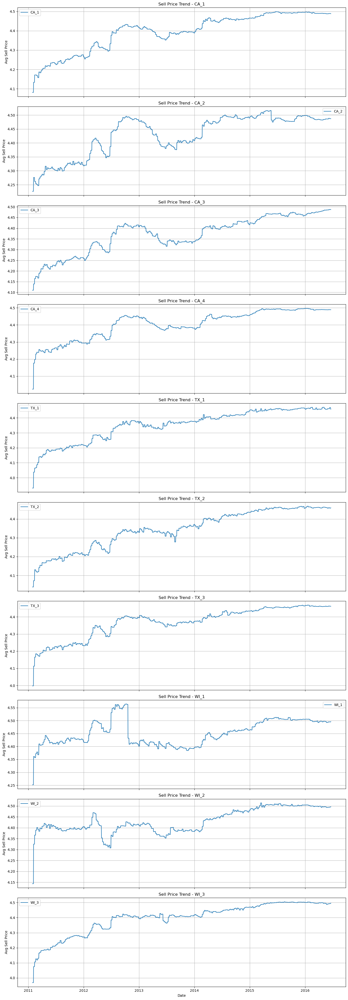

In [24]:
# Calculate daily average per store
daily_store_avg = merged.groupby(['date', 'store_id'])['sell_price'].mean().reset_index()

# Get unique stores
stores = daily_store_avg['store_id'].unique()

# Create subplots
fig, axes = plt.subplots(len(stores), 1, figsize=(14, 4*len(stores)), sharex=True)

for i, store in enumerate(stores):
    store_data = daily_store_avg[daily_store_avg['store_id'] == store]
    axes[i].plot(store_data['date'], store_data['sell_price'], label=store)
    axes[i].set_title(f'Sell Price Trend - {store}')
    axes[i].set_ylabel('Avg Sell Price')
    axes[i].grid(True)
    axes[i].legend()

# Common X-axis label
axes[-1].set_xlabel('Date')

plt.tight_layout()
plt.show()


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/1225545081.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  daily_store_avg = merged.groupby(['date', 'store_id'])['sell_price'].mean().reset_index()


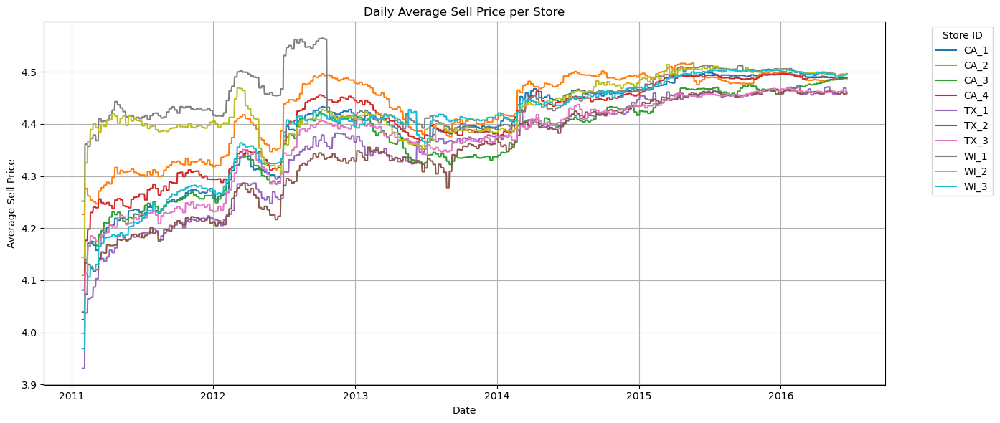

In [25]:
# Daily average per store
daily_store_avg = merged.groupby(['date', 'store_id'])['sell_price'].mean().reset_index()

# Plot all stores in single plot
plt.figure(figsize=(14, 6))

for store in daily_store_avg['store_id'].unique():
    store_data = daily_store_avg[daily_store_avg['store_id'] == store]
    plt.plot(store_data['date'], store_data['sell_price'], label=store)

plt.title('Daily Average Sell Price per Store')
plt.xlabel('Date')
plt.ylabel('Average Sell Price')
plt.legend(title='Store ID', bbox_to_anchor=(1.05, 1), loc='upper left')  # Legend outside
plt.grid(True)
plt.tight_layout()
plt.show()


In [26]:
unique_item_count_per_store = merged.groupby('store_id')['item_id'].nunique().reset_index()
unique_item_count_per_store.columns = ['store_id', 'unique_item_count']

print(unique_item_count_per_store)


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/1898642011.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  unique_item_count_per_store = merged.groupby('store_id')['item_id'].nunique().reset_index()


  store_id  unique_item_count
0     CA_1               3049
1     CA_2               3049
2     CA_3               3049
3     CA_4               3049
4     TX_1               3049
5     TX_2               3049
6     TX_3               3049
7     WI_1               3049
8     WI_2               3049
9     WI_3               3049


In [27]:
# Filter for CA_1 store
ca1_data = merged[merged['store_id'] == 'CA_1']

# Get unique items
unique_items = ca1_data['item_id'].unique()

# Count items by prefix
hobbies_count = sum(item.startswith('HOBBIES') for item in unique_items)
household_count = sum(item.startswith('HOUSEHOLD') for item in unique_items)
foods_count = sum(item.startswith('FOODS') for item in unique_items)

print(f"HOBBIES items: {hobbies_count}")
print(f"HOUSEHOLD items: {household_count}")
print(f"FOODS items: {foods_count}")


HOBBIES items: 565
HOUSEHOLD items: 1047
FOODS items: 1437


In [28]:
# Filter data for CA_1
ca1_data = merged[merged['store_id'] == 'CA_1']

# Get unique item_ids
unique_items = ca1_data['item_id'].unique()

# Initialize result dictionary
counts = {}

# Prefixes to check
prefixes = ['HOBBIES', 'HOUSEHOLD', 'FOODS']

# Count for each prefix + number 1-9
for prefix in prefixes:
    for num in range(1, 10):
        pattern = f"{prefix}_{num}"
        count = sum(item.startswith(pattern) for item in unique_items)
        if count > 0:
            counts[pattern] = count

# Convert to dataframe for readability
result_df = pd.DataFrame(list(counts.items()), columns=['Category', 'Count'])

print(result_df)


      Category  Count
0    HOBBIES_1    416
1    HOBBIES_2    149
2  HOUSEHOLD_1    532
3  HOUSEHOLD_2    515
4      FOODS_1    216
5      FOODS_2    398
6      FOODS_3    823


In [30]:
# 1. Filter rows where event_name_1 is not null
events_df = calendar[calendar['event_name_1'].notnull()][
    ['date', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2']
]

# 2. Combine event_name_1 and event_type_1
events_df['event_1'] = events_df.apply(
    lambda x: f"{x['event_name_1']} ({x['event_type_1']})" if pd.notnull(x['event_name_1']) else None,
    axis=1
)

# 3. Combine event_name_2 and event_type_2
events_df['event_2'] = events_df.apply(
    lambda x: f"{x['event_name_2']} ({x['event_type_2']})" if pd.notnull(x['event_name_2']) else None,
    axis=1
)

# 4. Final dataframe: keep date + events (no duplicates)
final_events = events_df[['date', 'event_1', 'event_2']].drop_duplicates()

# 5. Format date as "Day Month Year"
final_events['formatted_date'] = final_events['date'].dt.strftime('%d %B %Y')

# 6. Group distinct formatted dates for event_1
event_1_grouped = final_events.dropna(subset=['event_1']).groupby('event_1')['formatted_date'].unique().reset_index()
event_1_grouped.columns = ['Event_1', 'Distinct_Dates']

# Add count of distinct dates
event_1_grouped['Count'] = event_1_grouped['Distinct_Dates'].apply(len)

# 7. Group distinct formatted dates for event_2
event_2_grouped = final_events.dropna(subset=['event_2']).groupby('event_2')['formatted_date'].unique().reset_index()
event_2_grouped.columns = ['Event_2', 'Distinct_Dates']

# Add count of distinct dates
event_2_grouped['Count'] = event_2_grouped['Distinct_Dates'].apply(len)

# 8. Display
print("Event_1 with distinct dates and count:")
display(event_1_grouped)

print("\nEvent_2 with distinct dates and count:")
display(event_2_grouped)


Event_1 with distinct dates and count:


,Event_1,Distinct_Dates,Count
0,Chanukah End (Religious),"[28 December 2011, 16 December 2012, 05 Decemb...",5
1,Christmas (National),"[25 December 2011, 25 December 2012, 25 Decemb...",5
2,Cinco De Mayo (Cultural),"[05 May 2011, 05 May 2012, 05 May 2014, 05 May...",5
3,ColumbusDay (National),"[10 October 2011, 08 October 2012, 14 October ...",5
4,Easter (Cultural),"[08 April 2012, 31 March 2013, 20 April 2014, ...",5
5,Eid al-Fitr (Religious),"[31 August 2011, 19 August 2012, 08 August 201...",5
6,EidAlAdha (Religious),"[07 November 2011, 26 October 2012, 15 October...",5
7,Father's day (Cultural),"[19 June 2011, 17 June 2012, 16 June 2013, 21 ...",4
8,Halloween (Cultural),"[31 October 2011, 31 October 2012, 31 October ...",5
9,IndependenceDay (National),"[04 July 2011, 04 July 2012, 04 July 2013, 04 ...",5



Event_2 with distinct dates and count:


,Event_2,Distinct_Dates,Count
0,Cinco De Mayo (Cultural),[05 May 2013],1
1,Easter (Cultural),[24 April 2011],1
2,Father's day (Cultural),"[15 June 2014, 19 June 2016]",2
3,OrthodoxEaster (Religious),[20 April 2014],1


In [31]:
print(calendar['event_type_1'].unique())
print(calendar['event_type_2'].unique())

[NaN, 'Sporting', 'Cultural', 'National', 'Religious']
Categories (4, object): ['Cultural', 'National', 'Religious', 'Sporting']
[NaN, 'Cultural', 'Religious']
Categories (2, object): ['Cultural', 'Religious']


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/565723269.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sales_event_store = sales_on_events.groupby(['store_id', 'date'])['sell_price'].mean().reset_index()


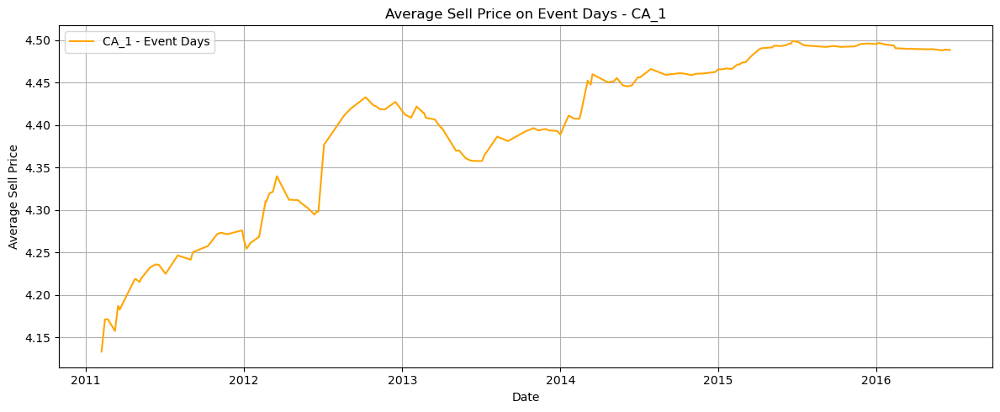

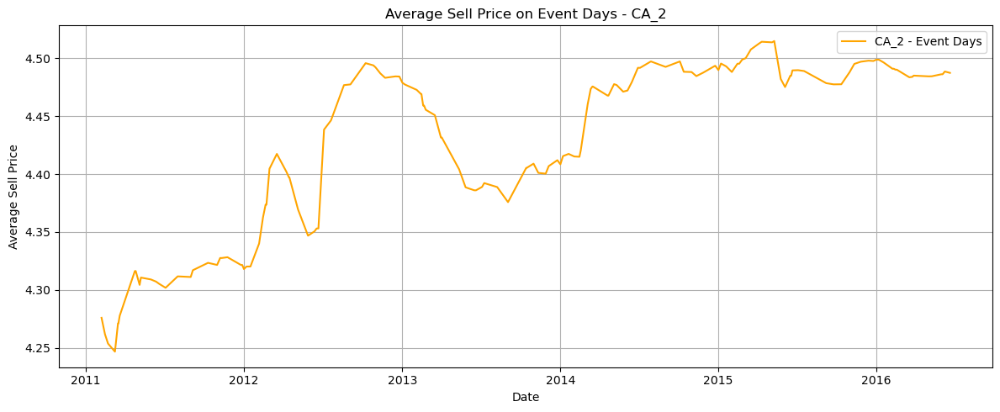

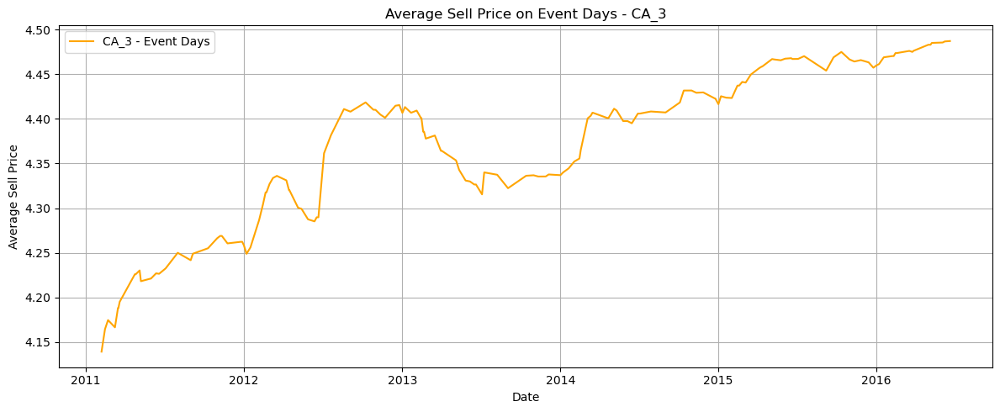

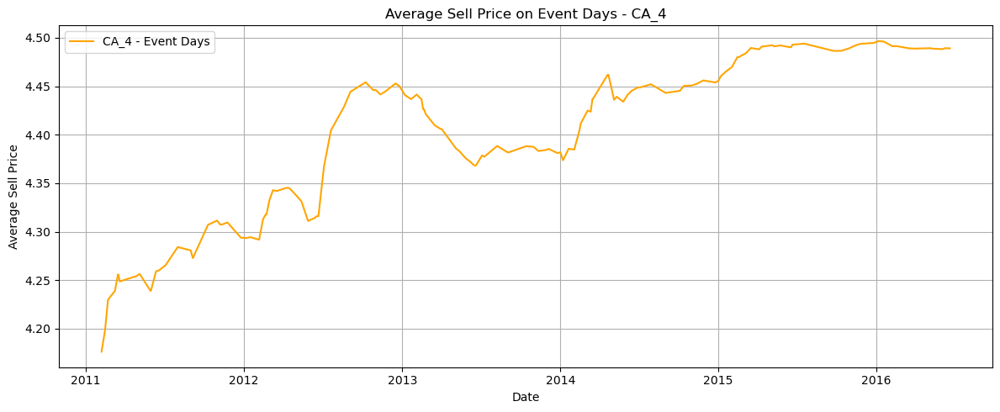

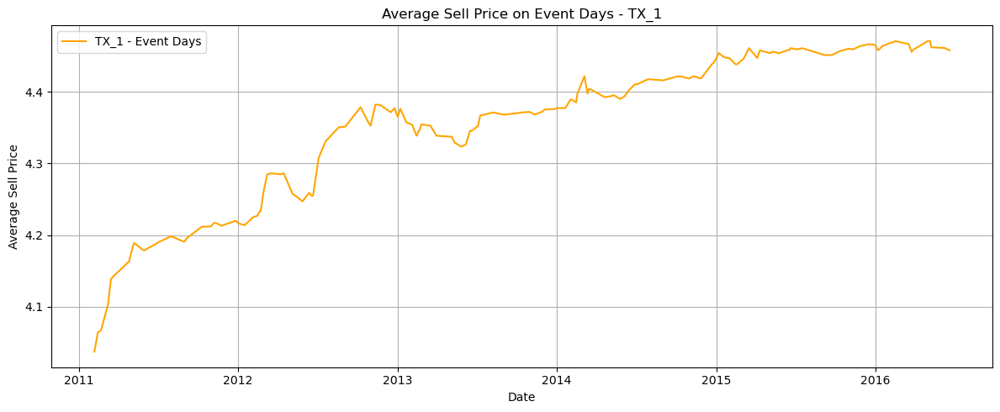

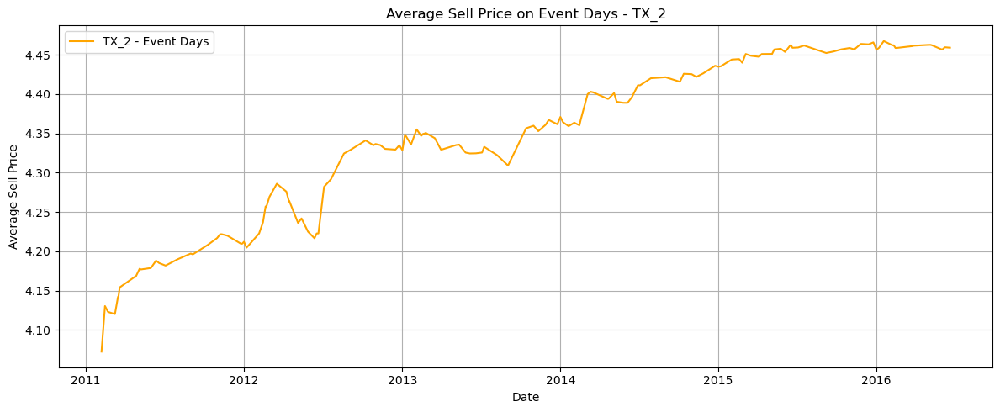

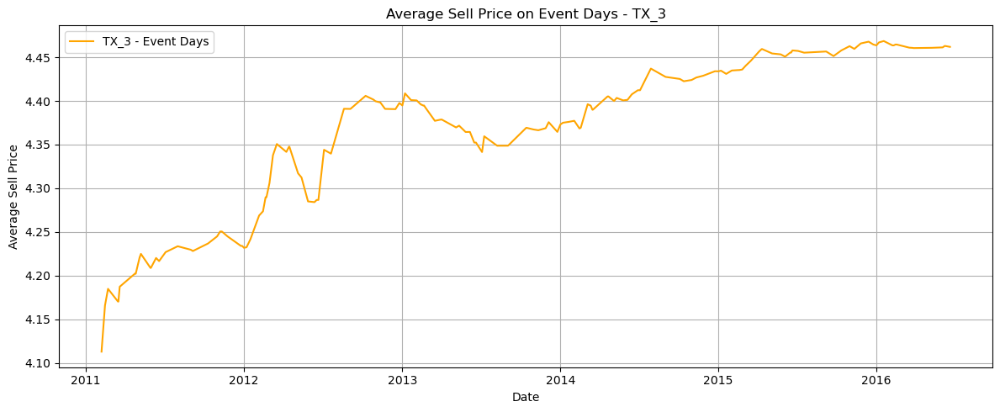

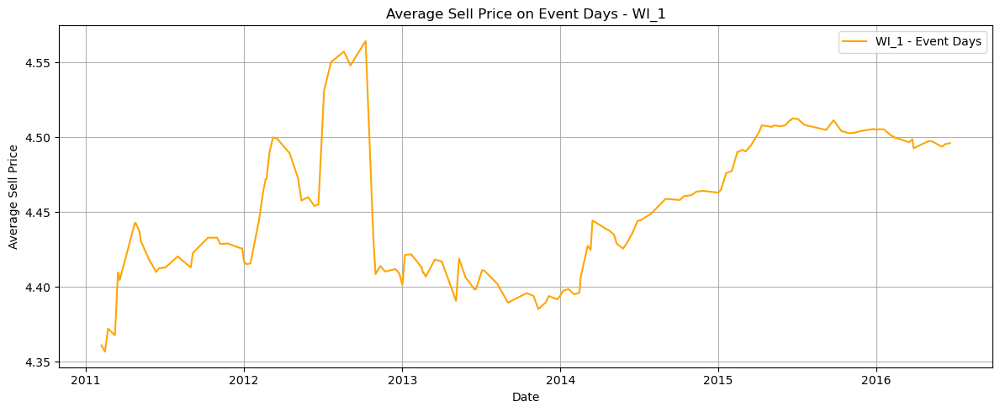

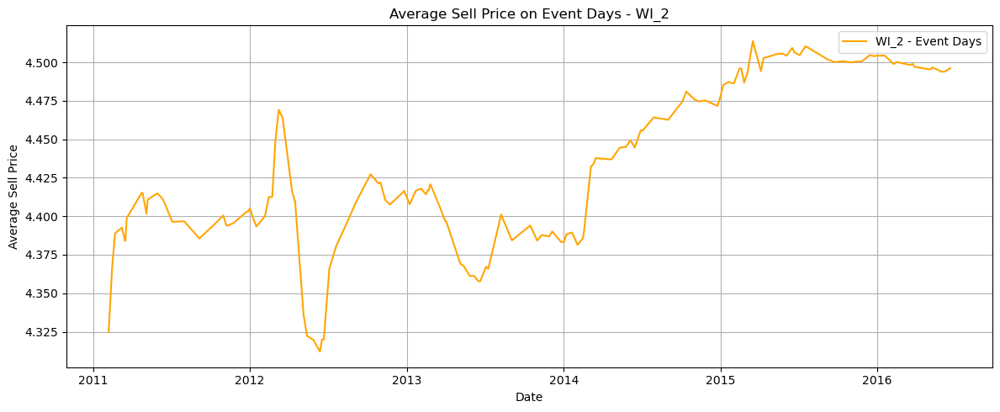

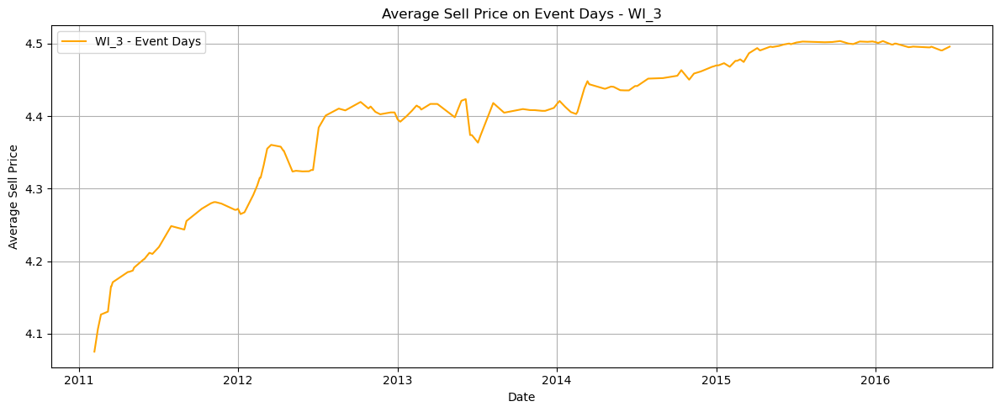

In [32]:
# 1. Get event dates from calendar
event_dates = calendar[calendar['event_name_1'].notnull()]['date'].unique()

# 2. Filter merged data for only event dates
sales_on_events = merged[merged['date'].isin(event_dates)]

# 3. Group by date and store_id for average sell price
sales_event_store = sales_on_events.groupby(['store_id', 'date'])['sell_price'].mean().reset_index()

# 4. Get first 10 store IDs
stores = sales_event_store['store_id'].unique()[:10]

# 5. Plot each store separately
for store in stores:
    plt.figure(figsize=(12, 5))
    store_data = sales_event_store[sales_event_store['store_id'] == store]
    
    plt.plot(store_data['date'], store_data['sell_price'], label=f'{store} - Event Days', color='orange')
    
    plt.title(f'Average Sell Price on Event Days - {store}')
    plt.xlabel('Date')
    plt.ylabel('Average Sell Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/2194518679.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  overall_sales = merged.groupby(['store_id', 'date'])['sell_price'].mean().reset_index()
/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/2194518679.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  event_sales = merged[merged['date'].isin(event_dates)].groupby(['store_id', 'date'])['sell_price'].mean().reset_index()


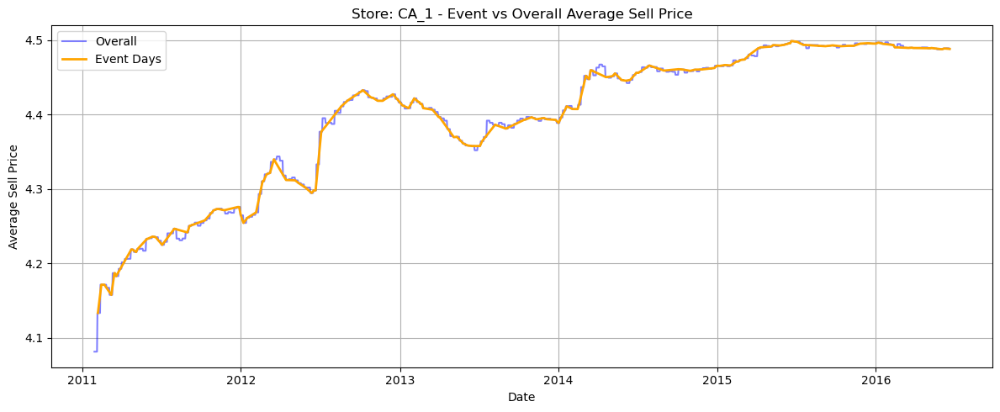

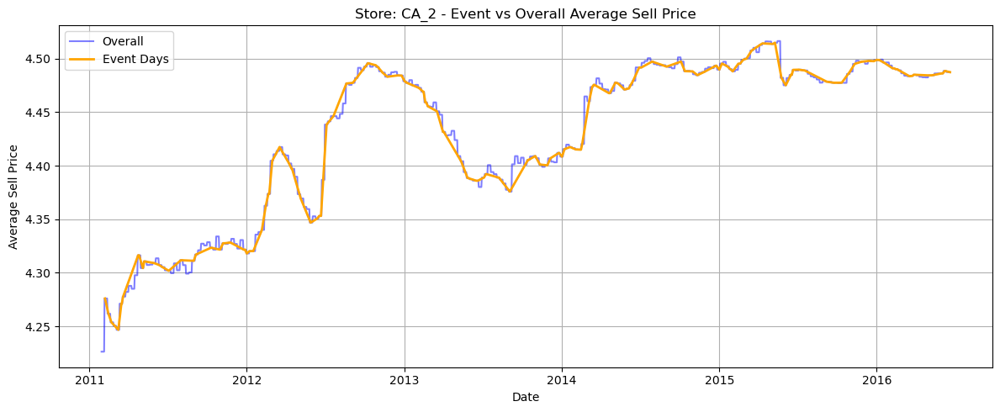

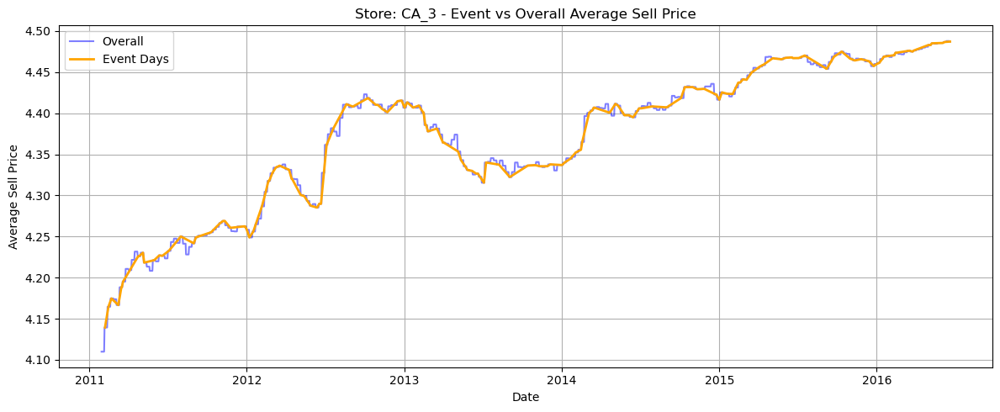

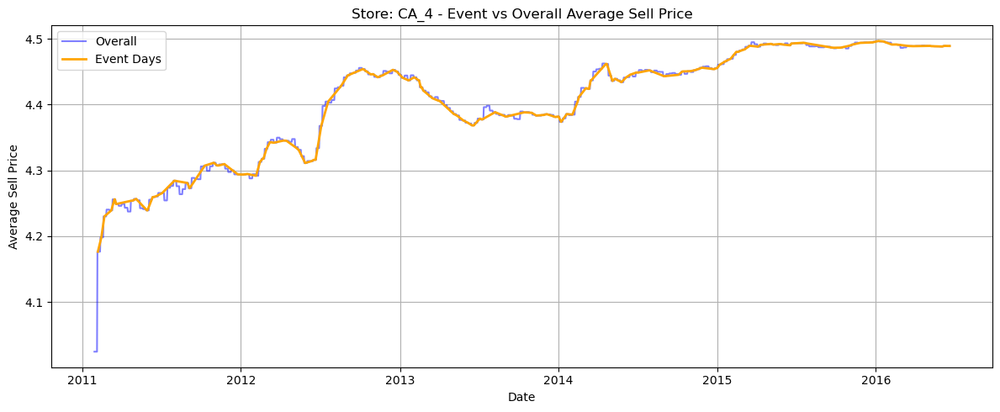

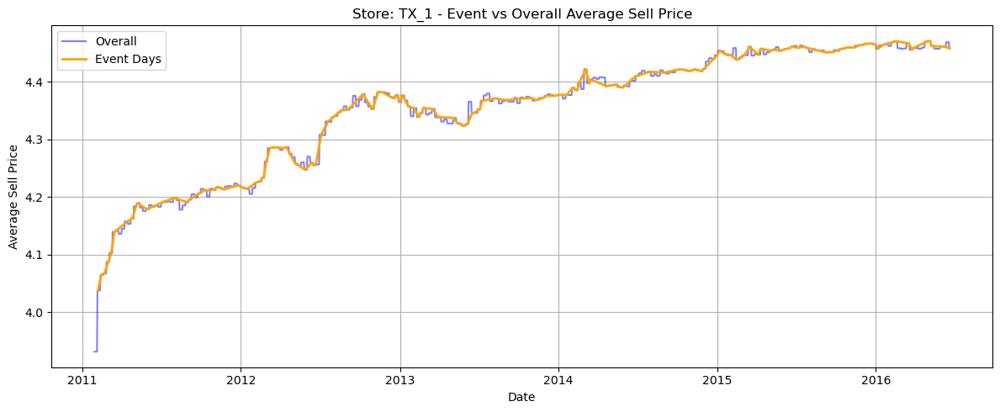

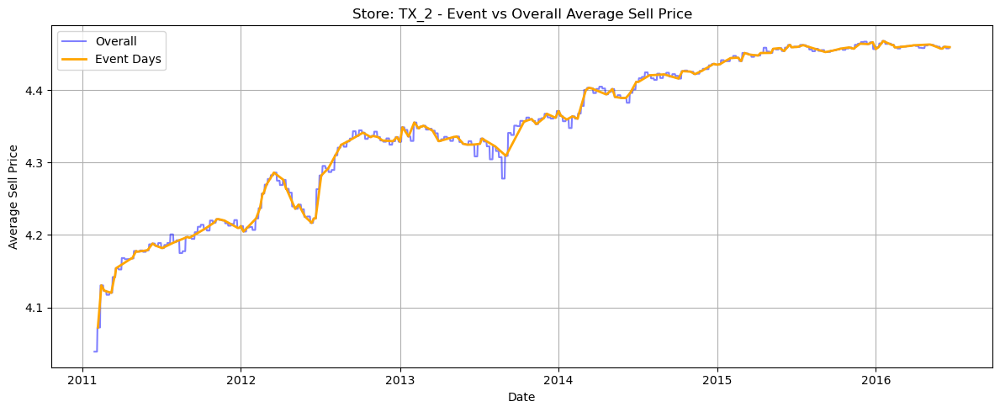

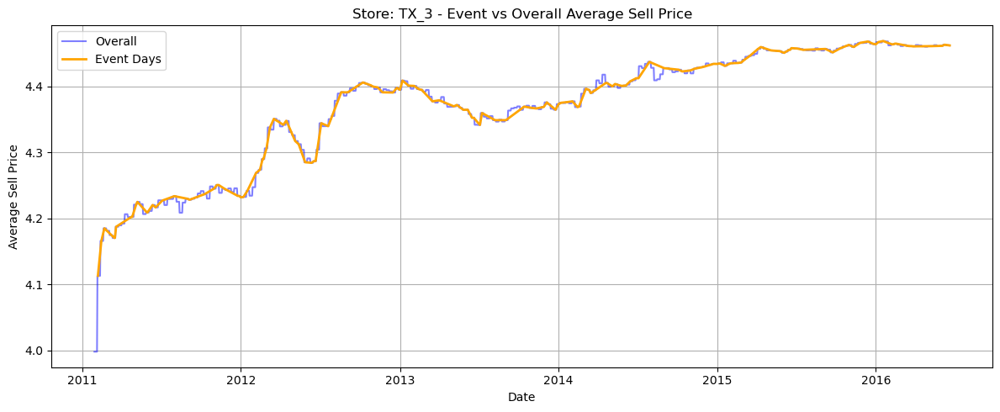

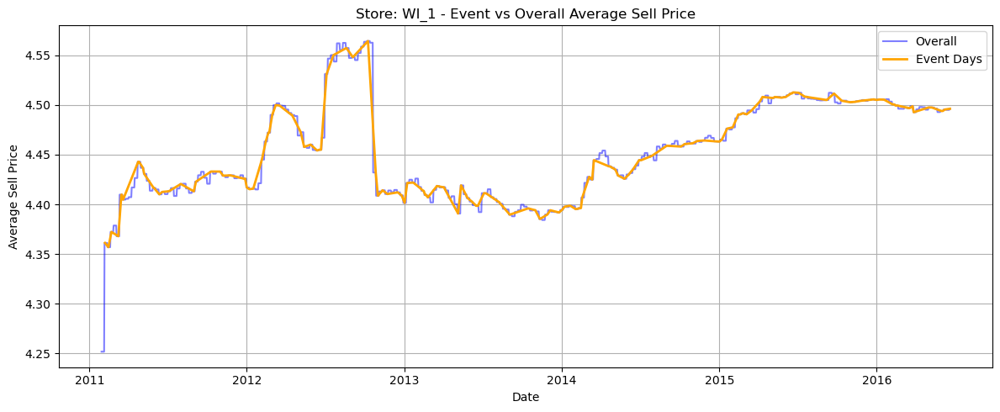

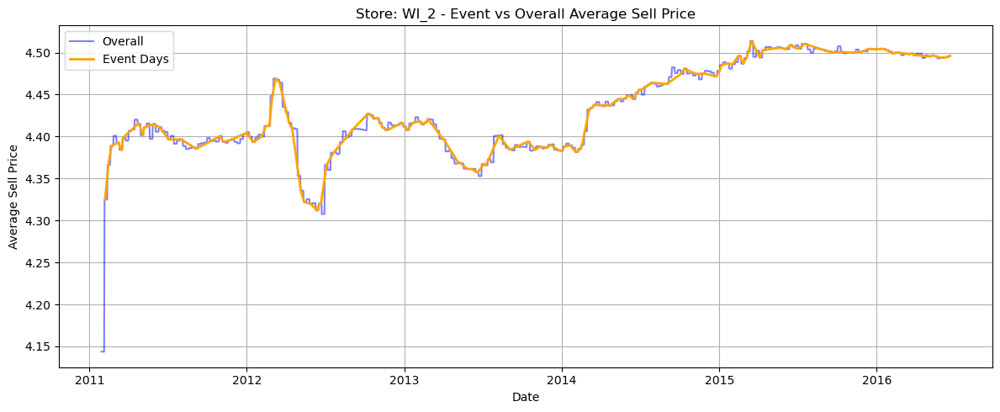

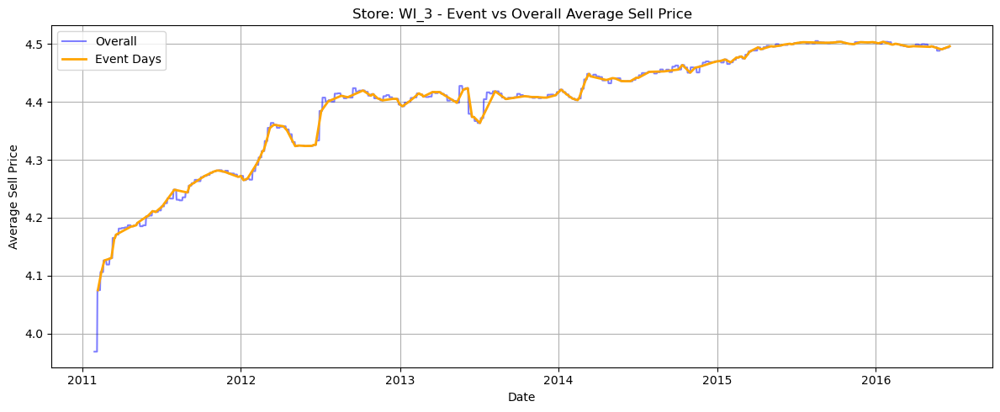

In [33]:
# --- 1. Overall daily average per store ---
overall_sales = merged.groupby(['store_id', 'date'])['sell_price'].mean().reset_index()

# --- 2. Event-day average per store ---
event_dates = calendar[calendar['event_name_1'].notnull()]['date'].unique()
event_sales = merged[merged['date'].isin(event_dates)].groupby(['store_id', 'date'])['sell_price'].mean().reset_index()

# --- 3. Get unique store IDs (limit to first 10 stores if more exist) ---
stores = overall_sales['store_id'].unique()[:10]

# --- 4. Generate plots ---
for store in stores:
    plt.figure(figsize=(12, 5))
    
    # Plot overall sales
    store_overall = overall_sales[overall_sales['store_id'] == store]
    plt.plot(store_overall['date'], store_overall['sell_price'], label='Overall', alpha=0.5, color='blue')
    
    # Plot event-day sales
    store_event = event_sales[event_sales['store_id'] == store]
    plt.plot(store_event['date'], store_event['sell_price'], label='Event Days', linewidth=2, color='orange')
    
    # Title and labels
    plt.title(f'Store: {store} - Event vs Overall Average Sell Price')
    plt.xlabel('Date')
    plt.ylabel('Average Sell Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


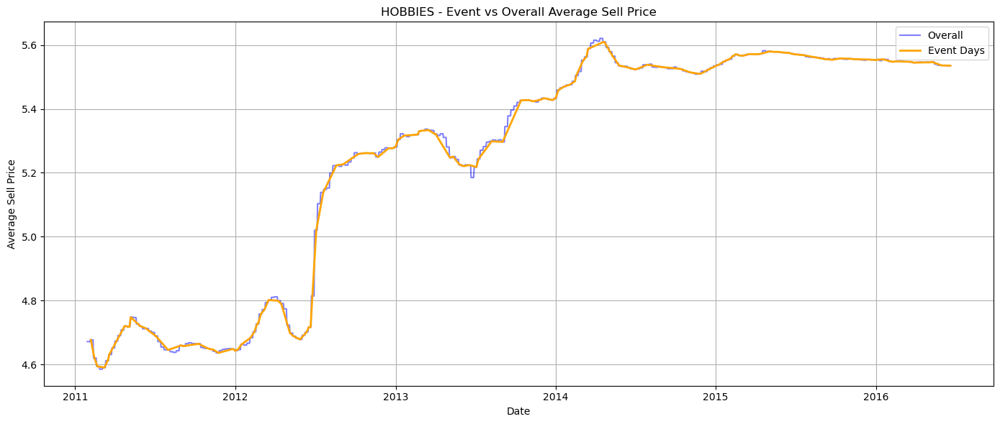

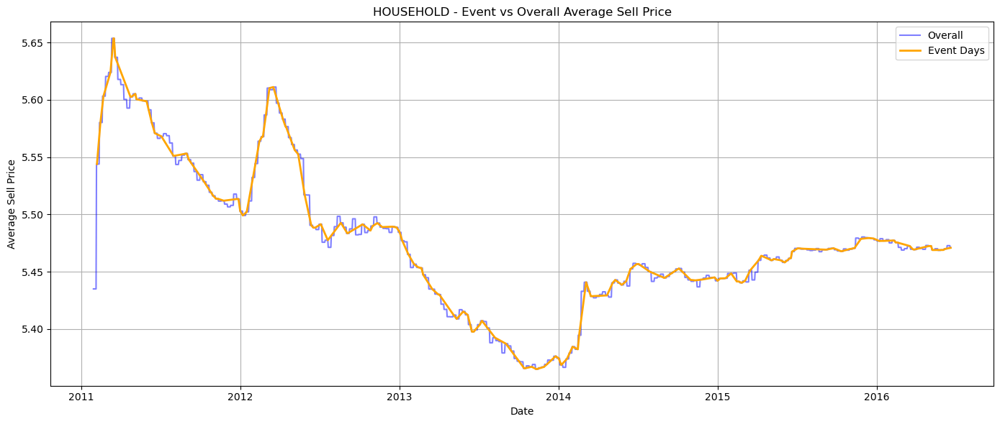

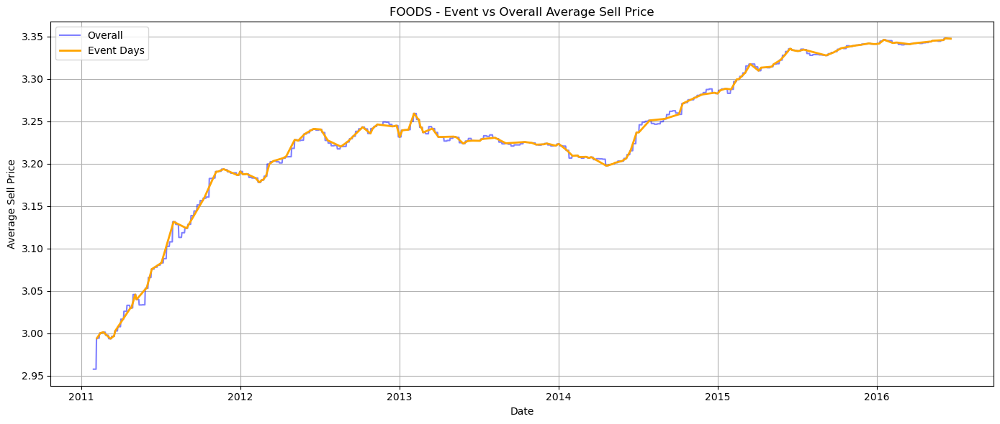

In [34]:
# --- 1. Filter event dates ---
event_dates = calendar[calendar['event_name_1'].notnull()]['date'].unique()

# --- 2. Separate data by category prefixes ---
categories = ['HOBBIES', 'HOUSEHOLD', 'FOODS']

for category in categories:
    # Filter merged for items starting with category
    cat_data = merged[merged['item_id'].str.startswith(category)]
    
    # Overall daily average for this category
    overall_cat = cat_data.groupby('date')['sell_price'].mean().reset_index()
    
    # Event-day average for this category
    event_cat = cat_data[cat_data['date'].isin(event_dates)].groupby('date')['sell_price'].mean().reset_index()
    
    # --- Plot ---
    plt.figure(figsize=(14, 6))
    
    # Plot overall
    plt.plot(overall_cat['date'], overall_cat['sell_price'], label='Overall', alpha=0.5, color='blue')
    
    # Plot event days
    plt.plot(event_cat['date'], event_cat['sell_price'], label='Event Days', linewidth=2, color='orange')
    
    # Title and labels
    plt.title(f'{category} - Event vs Overall Average Sell Price')
    plt.xlabel('Date')
    plt.ylabel('Average Sell Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


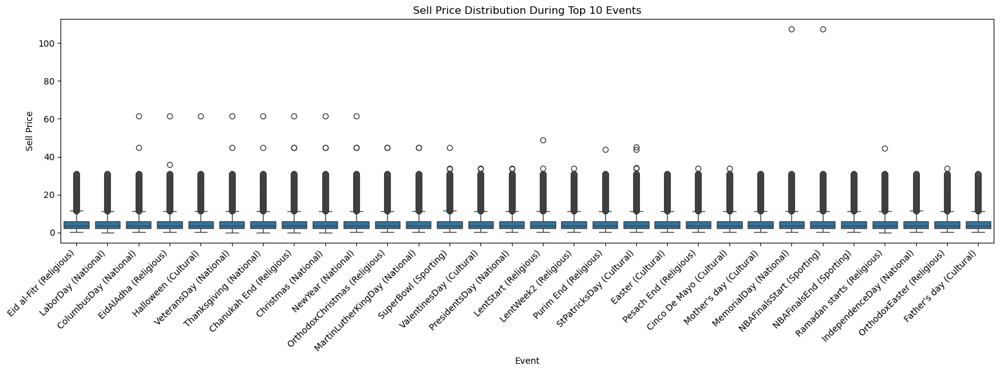

In [35]:
# 1. Filter rows where events are not null
event_df = merged[merged['event_name_1'].notnull()].copy()

# 2. Optional: Combine name and type for clarity
event_df['event_label'] = event_df.apply(
    lambda x: f"{x['event_name_1']} ({x['event_type_1']})" 
    if pd.notnull(x['event_type_1']) else x['event_name_1'],
    axis=1
)

# 3. Limit to top 10 most frequent events to avoid clutter
# top_events = event_df['event_label'].value_counts().index[:10]
# event_df = event_df[event_df['event_label'].isin(top_events)]

# 4. Plot
plt.figure(figsize=(16, 6))
sns.boxplot(data=event_df, x='event_label', y='sell_price')
plt.xticks(rotation=45, ha='right')
plt.title('Sell Price Distribution During Top 10 Events')
plt.xlabel('Event')
plt.ylabel('Sell Price')
plt.tight_layout()
plt.show()


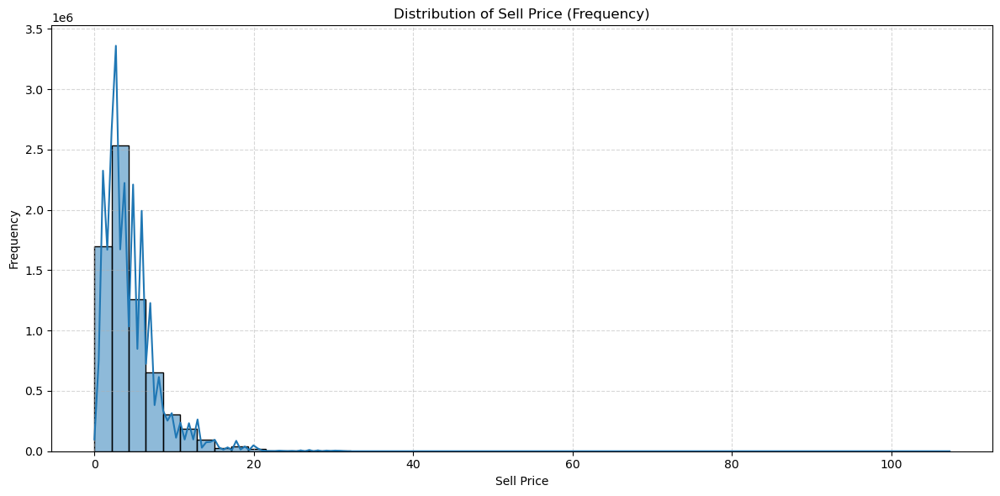

In [36]:
plt.figure(figsize=(12, 6))

# Histogram with KDE
sns.histplot(sell_prices['sell_price'], bins=50, kde=True)

plt.title('Distribution of Sell Price (Frequency)')
plt.xlabel('Sell Price')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


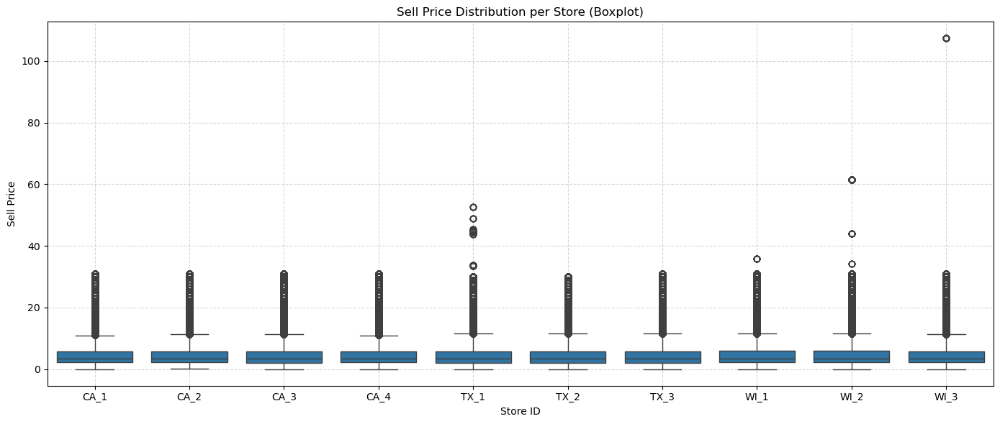

In [37]:
plt.figure(figsize=(14, 6))

# Boxplot per store
sns.boxplot(data=merged, x='store_id', y='sell_price')

plt.title('Sell Price Distribution per Store (Boxplot)')
plt.xlabel('Store ID')
plt.ylabel('Sell Price')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


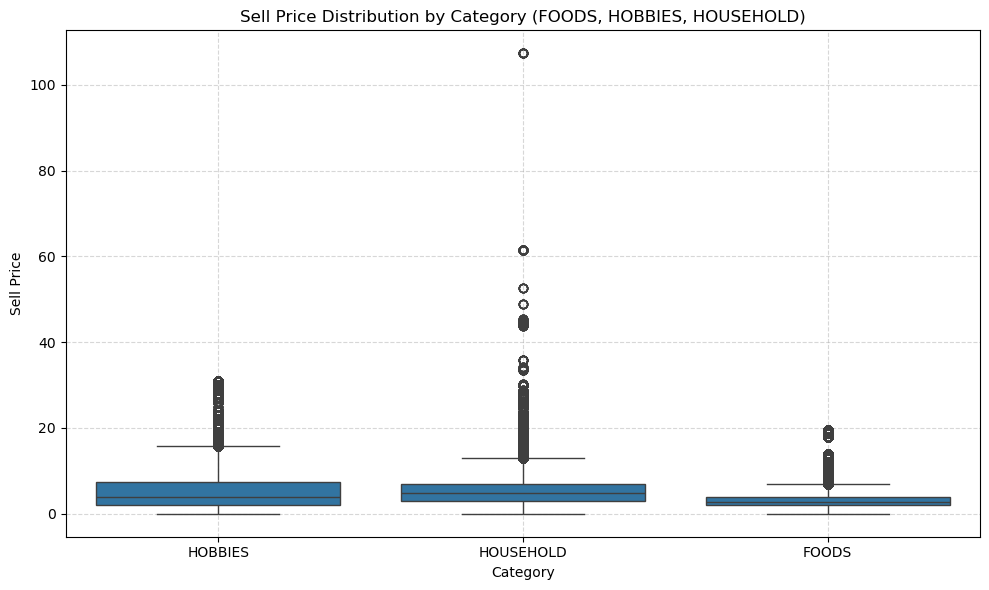

In [38]:
plt.figure(figsize=(10, 6))

# Filter only three categories
categories = ['FOODS', 'HOBBIES', 'HOUSEHOLD']
filtered_data = merged[merged['item_id'].str.startswith(tuple(categories))]

# Extract main category name (remove numbers from item_id)
filtered_data['Category'] = filtered_data['item_id'].str.extract(r'(^[A-Z]+)')

# Plot boxplot
sns.boxplot(data=filtered_data, x='Category', y='sell_price')

plt.title('Sell Price Distribution by Category (FOODS, HOBBIES, HOUSEHOLD)')
plt.xlabel('Category')
plt.ylabel('Sell Price')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [39]:
# 1. Filter data for FOODS, HOBBIES, HOUSEHOLD
categories = ['FOODS', 'HOBBIES', 'HOUSEHOLD']
filtered = merged[merged['item_id'].str.startswith(tuple(categories))].copy()

# 2. Extract category name (remove numbers)
filtered['Category'] = filtered['item_id'].str.extract(r'(^[A-Z]+)')

# 3. Group by Category to get min/max values
pivot_data = filtered.groupby('Category')['sell_price'].agg(['min', 'max']).reset_index()

# 4. Get corresponding item_id for min and max
min_item_ids = (
    filtered.loc[filtered.groupby('Category')['sell_price'].idxmin()][['Category', 'item_id']]
    .rename(columns={'item_id': 'Min_Item_ID'})
)

max_item_ids = (
    filtered.loc[filtered.groupby('Category')['sell_price'].idxmax()][['Category', 'item_id']]
    .rename(columns={'item_id': 'Max_Item_ID'})
)

# 5. Merge everything
pivot_result = pivot_data.merge(min_item_ids, on='Category').merge(max_item_ids, on='Category')

# 6. Final pivot table
print(pivot_result)


    Category   min     max      Min_Item_ID      Max_Item_ID
0      FOODS  0.01   19.48      FOODS_3_413      FOODS_3_083
1    HOBBIES  0.01   30.98    HOBBIES_1_261    HOBBIES_1_060
2  HOUSEHOLD  0.01  107.32  HOUSEHOLD_1_443  HOUSEHOLD_2_406


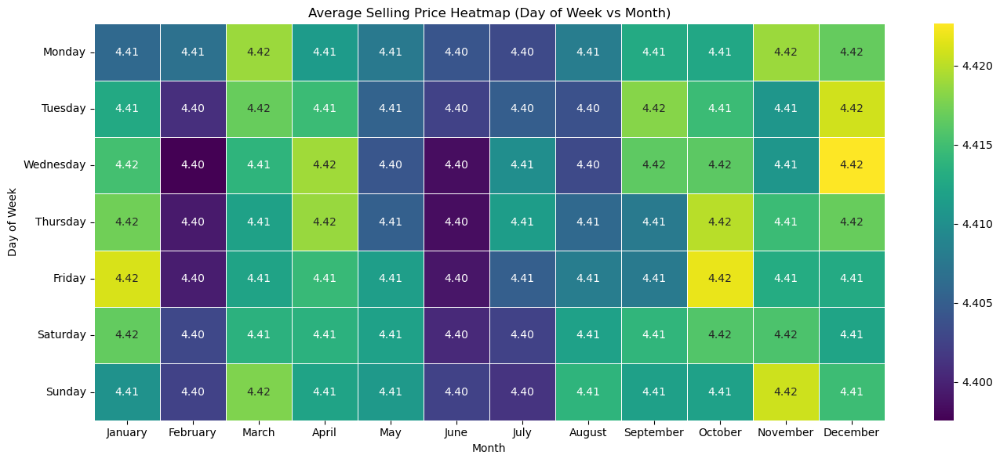

In [40]:
# 2. Extract Month and Day of Week
merged['Month'] = merged['date'].dt.month_name()   # e.g., January, February
merged['DayOfWeek'] = merged['date'].dt.day_name() # e.g., Monday, Tuesday

# Optional: Order days and months for better visualization
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# 3. Compute average selling price
heatmap_data = merged.groupby(['DayOfWeek', 'Month'])['sell_price'].mean().reset_index()

# 4. Pivot for heatmap
heatmap_pivot = heatmap_data.pivot(index='DayOfWeek', columns='Month', values='sell_price')
heatmap_pivot = heatmap_pivot.reindex(index=day_order, columns=month_order)

# 5. Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_pivot, cmap='viridis', annot=True, fmt=".2f", linewidths=0.5)

plt.title('Average Selling Price Heatmap (Day of Week vs Month)')
plt.xlabel('Month')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()


In [42]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# --- Use merged dataset (already loaded) ---
# Ensure proper datetime
merged['date'] = pd.to_datetime(merged['date'])

# --- Sort by item_id and date ---
merged = merged.sort_values(by=['item_id', 'date'])

# --- Get unique item IDs ---
ids = sorted(merged['item_id'].unique())

# --- Select 3 sample items ---
samples = [
    ids[0],    # First item
    ids[5],    # Sixth item
    ids[10]    # Eleventh item
]

# --- Create subplots ---
fig = make_subplots(rows=3, cols=1, subplot_titles=[f"Selling Price: {i}" for i in samples])

# Colors for each subplot
colors = ["mediumseagreen", "violet", "dodgerblue"]

# --- Plot each sample ---
for i, (item_id, color) in enumerate(zip(samples, colors), start=1):
    # Filter data for the item
    item_data = merged[merged['item_id'] == item_id]

    # Add trace
    fig.add_trace(
        go.Scatter(
            x=item_data['date'],
            y=item_data['sell_price'],
            mode='lines+markers',
            name=item_id,
            marker=dict(color=color),
            showlegend=False
        ),
        row=i, col=1
    )

# --- Layout ---
fig.update_layout(
    height=1200, width=800,
    title_text="Sample Selling Price Trends (Three Items from Merged Dataset)",
    title_x=0.5,
    xaxis_title="Date",
    yaxis_title="Selling Price"
)

fig.show()


In [45]:
merged = merged.sort_values(by=['item_id', 'date'])

# --- Unique IDs ---
ids = sorted(merged['item_id'].unique())

# --- Select 3 sample items ---
samples = [ids[0], ids[5], ids[10]]

# --- Subplot titles (3 per item) ---
subplot_titles = [
    title
    for item in samples
    for title in (f"{item} - Full Trend", f"{item} - Random Week", f"{item} - Random Month")
]

# --- Create subplots 3 rows × 3 columns ---
fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=subplot_titles
)

colors = ["mediumseagreen", "violet", "dodgerblue"]

for row, (item_id, color) in enumerate(zip(samples, colors), start=1):
    # Filter data
    item_data = merged[merged['item_id'] == item_id]

    # Full trend
    fig.add_trace(
        go.Scatter(
            x=item_data['date'], y=item_data['sell_price'],
            mode='lines+markers', marker=dict(color=color),
            showlegend=False
        ),
        row=row, col=1
    )

    # Random week zoom
    min_date, max_date = item_data['date'].min(), item_data['date'].max()
    random_start = min_date + pd.Timedelta(days=np.random.randint(0, (max_date - min_date).days - 7))
    week_mask = (item_data['date'] >= random_start) & (item_data['date'] <= random_start + pd.Timedelta(days=7))
    week_data = item_data[week_mask]

    fig.add_trace(
        go.Scatter(
            x=week_data['date'], y=week_data['sell_price'],
            mode='lines+markers', marker=dict(color=color),
            showlegend=False
        ),
        row=row, col=2
    )

    # Random month zoom
    random_start_month = min_date + pd.Timedelta(days=np.random.randint(0, (max_date - min_date).days - 30))
    month_mask = (item_data['date'] >= random_start_month) & (item_data['date'] <= random_start_month + pd.Timedelta(days=30))
    month_data = item_data[month_mask]

    fig.add_trace(
        go.Scatter(
            x=month_data['date'], y=month_data['sell_price'],
            mode='lines+markers', marker=dict(color=color),
            showlegend=False
        ),
        row=row, col=3
    )

# Layout
fig.update_layout(
    height=1500, width=1200,
    title_text="Selling Price Trends with Zoomed Random Week & Month",
    title_x=0.5
)
fig.show()


In [47]:
def remove_outliers_iqr(df, group_cols, value_col='sell_price'):
    """Remove outliers within each group using IQR"""
    def iqr_filter(series):
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        return series.where(
            (series >= Q1 - 1.5 * IQR) & (series <= Q3 + 1.5 * IQR)
        )
    
    return df.groupby(group_cols, group_keys=False).apply(
        lambda g: g.assign(**{value_col: iqr_filter(g[value_col])})
    )

# Apply on merged dataset
cleaned_df = remove_outliers_iqr(merged, ['store_id', 'item_id'], 'sell_price')


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/3328646243.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/3328646243.py:11: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [48]:
def apply_smoothing(df, group_cols, value_col='sell_price', window=7):
    """Smooth using rolling mean"""
    df[f'{value_col}_smooth'] = (
        df.groupby(group_cols)[value_col]
        .transform(lambda x: x.rolling(window, center=True, min_periods=1).mean())
    )
    return df

cleaned_df = apply_smoothing(cleaned_df, ['store_id', 'item_id'], 'sell_price', window=7)


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/741109419.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [59]:
from statsmodels.tsa.seasonal import STL

def extract_trend(df, group_cols, value_col='sell_price_smooth', period=7):
    """
    Extract trend using STL decomposition per group.
    Adds 'trend' column to df.
    """
    trend_values = []

    # Group and compute trend
    for keys, group in df.groupby(group_cols):
        group = group.sort_values('date')  # Ensure chronological order
        ts = group[value_col]

        # Apply STL only if enough non-NA points
        if ts.notna().sum() > period * 2:
            res = STL(ts, period=period).fit()
            trend = res.trend
        else:
            trend = pd.Series([np.nan] * len(group), index=group.index)

        trend_values.append(trend)

    # Combine trends into original dataframe order
    df['trend'] = pd.concat(trend_values).sort_index()
    return df

# Example usage
cleaned_df = extract_trend(cleaned_df, ['store_id', 'item_id'], 'sell_price_smooth', period=7)


/var/folders/wx/jzym72gd2698h02zv0df3phc0000gn/T/ipykernel_1004/1801729747.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [60]:
def add_time_features(df):
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    df['day_of_week'] = df['date'].dt.dayofweek
    df['week_of_year'] = df['date'].dt.isocalendar().week.astype(int)
    df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)

    # Cyclical encoding for seasonality
    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    
    return df

cleaned_df = add_time_features(cleaned_df)


In [61]:
# Final processed dataset
forecasting_df = cleaned_df.copy()

print(forecasting_df.head())
print(forecasting_df.columns)


         store_id      item_id  wm_yr_wk  sell_price       date   weekday  \
2573162      CA_1  FOODS_1_001     11101         2.0 2011-01-29  Saturday   
7432444      CA_2  FOODS_1_001     11101         2.0 2011-01-29  Saturday   
11864572     CA_3  FOODS_1_001     11101         2.0 2011-01-29  Saturday   
16641947     CA_4  FOODS_1_001     11101         2.0 2011-01-29  Saturday   
21469589     TX_1  FOODS_1_001     11101         2.0 2011-01-29  Saturday   

          wday  month  year event_name_1 event_type_1 event_name_2  \
2573162      1      1  2011          NaN          NaN          NaN   
7432444      1      1  2011          NaN          NaN          NaN   
11864572     1      1  2011          NaN          NaN          NaN   
16641947     1      1  2011          NaN          NaN          NaN   
21469589     1      1  2011          NaN          NaN          NaN   

         event_type_2  snap_CA  snap_TX  snap_WI    Month DayOfWeek  \
2573162           NaN        0        0      

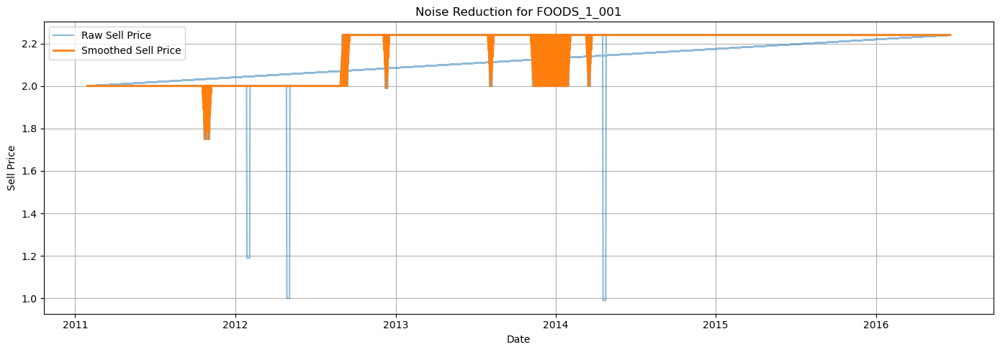

In [62]:
def plot_noise_removal(raw_df, clean_df, item_id):
    plt.figure(figsize=(14, 5))
    raw_data = raw_df[raw_df['item_id'] == item_id]
    clean_data = clean_df[clean_df['item_id'] == item_id]
    
    plt.plot(raw_data['date'], raw_data['sell_price'], label='Raw Sell Price', alpha=0.5)
    plt.plot(clean_data['date'], clean_data['sell_price_smooth'], label='Smoothed Sell Price', linewidth=2)
    
    plt.title(f"Noise Reduction for {item_id}")
    plt.xlabel("Date")
    plt.ylabel("Sell Price")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Example for one item from FOODS
sample_item = forecasting_df[forecasting_df['item_id'].str.startswith('FOODS')]['item_id'].unique()[0]
plot_noise_removal(merged, forecasting_df, sample_item)


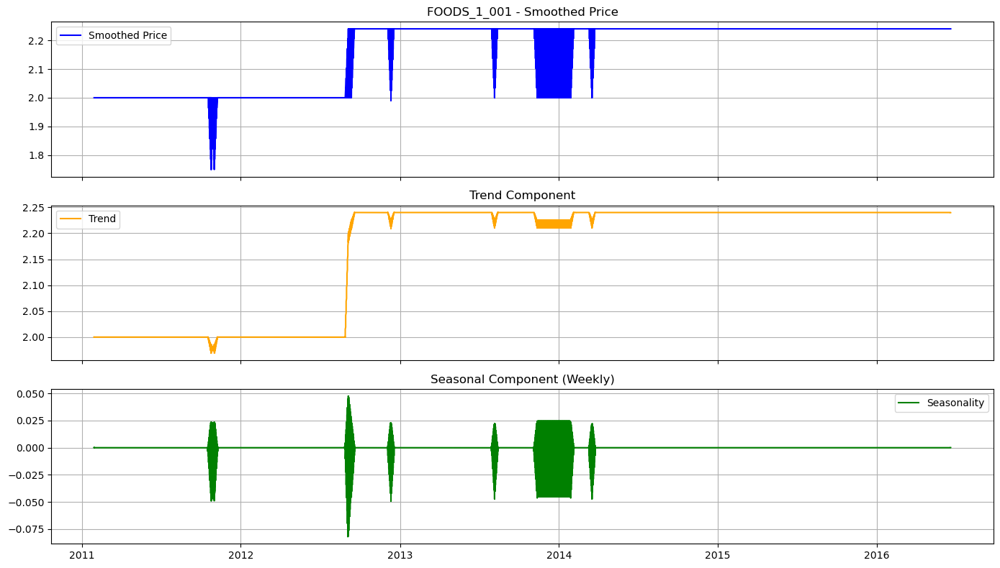

In [63]:
def plot_stl_decomposition(clean_df, item_id):
    item_series = clean_df[clean_df['item_id'] == item_id].set_index('date')['sell_price_smooth'].dropna()
    
    if len(item_series) > 14:
        stl = STL(item_series, period=7).fit()
        
        fig, axes = plt.subplots(3, 1, figsize=(14, 8), sharex=True)
        axes[0].plot(item_series.index, item_series.values, label='Smoothed Price', color='blue')
        axes[0].set_title(f"{item_id} - Smoothed Price")
        
        axes[1].plot(stl.trend.index, stl.trend.values, label='Trend', color='orange')
        axes[1].set_title("Trend Component")
        
        axes[2].plot(stl.seasonal.index, stl.seasonal.values, label='Seasonality', color='green')
        axes[2].set_title("Seasonal Component (Weekly)")
        
        for ax in axes:
            ax.grid(True)
            ax.legend()
        
        plt.tight_layout()
        plt.show()

plot_stl_decomposition(forecasting_df, sample_item)


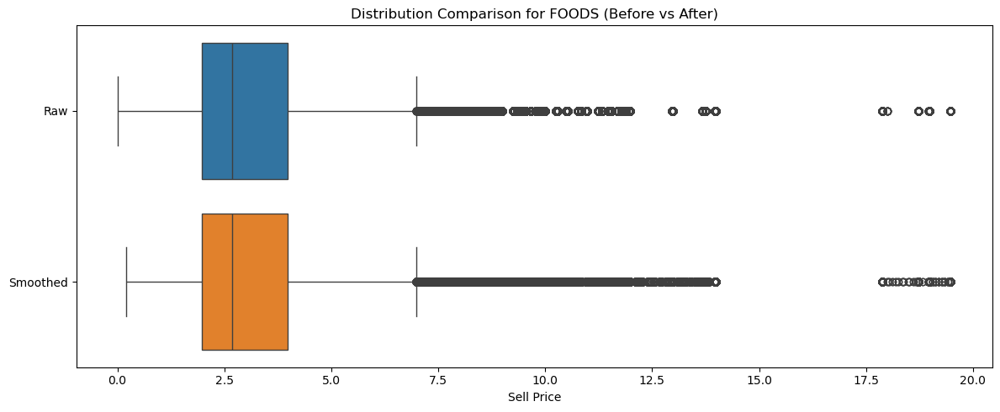

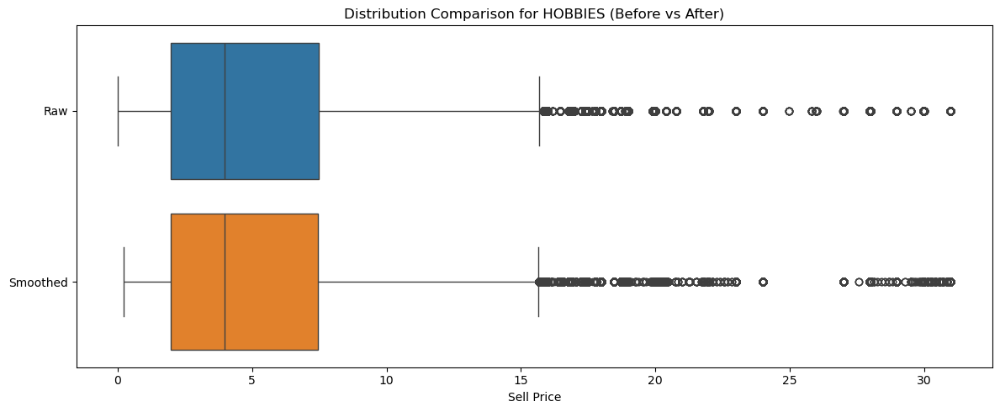

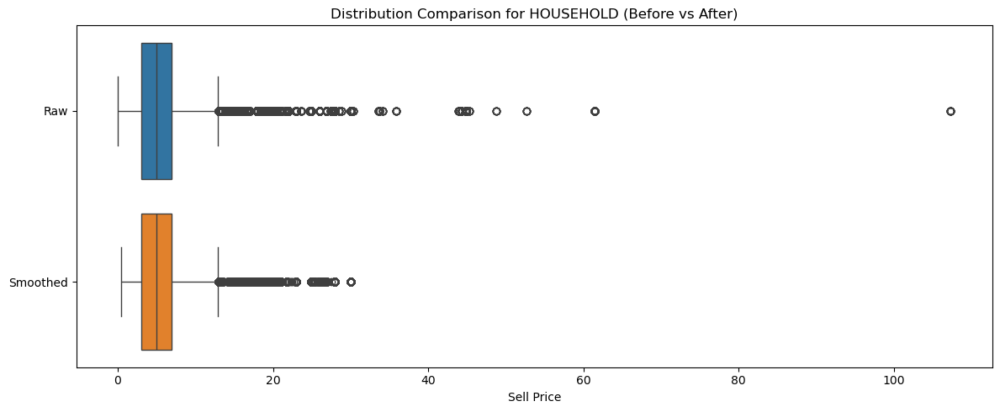

In [64]:
categories = ['FOODS', 'HOBBIES', 'HOUSEHOLD']

for category in categories:
    raw_cat = merged[merged['item_id'].str.startswith(category)]
    clean_cat = forecasting_df[forecasting_df['item_id'].str.startswith(category)]
    
    plt.figure(figsize=(12, 5))
    sns.boxplot(data=[raw_cat['sell_price'], clean_cat['sell_price_smooth']], orient='h')
    plt.yticks([0, 1], ['Raw', 'Smoothed'])
    plt.title(f"Distribution Comparison for {category} (Before vs After)")
    plt.xlabel("Sell Price")
    plt.tight_layout()
    plt.show()


In [6]:
f2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56619930 entries, 0 to 56619929
Data columns (total 37 columns):
 #   Column              Dtype         
---  ------              -----         
 0   id                  int16         
 1   item_id             int16         
 2   dept_id             int16         
 3   cat_id              int16         
 4   store_id            int16         
 5   state_id            int16         
 6   sales               int16         
 7   date                datetime64[ns]
 8   weekday             object        
 9   wday                int8          
 10  month               int8          
 11  year                int16         
 12  event_name_1        category      
 13  event_type_1        category      
 14  event_name_2        category      
 15  event_type_2        category      
 16  snap_CA             int8          
 17  snap_TX             int8          
 18  snap_WI             int8          
 19  sell_price          float32       
 20  